# <span style="color:purple"> Week 9 - Beyond Text
### <span style="color:purple">Reuters Newspaper</span>  
<span style="color:purple">-- File: Jingying (Jane) Bi Homework 9 <br>
-- Name: Jingying Bi <br>
-- UCID: 12174556 <br>
<br>
<span style="color:purple">**Research Object: ** <br>
Analyze the non-text data.

<span style="color:purple">**Method: ** <br>
(1) Blob Detection <br>
(2) Object Detection & Scene Classification:<br>
* <span style="color:purple"> Caffe <br>
* <span style="color:purple"> Places <br>
       
<span style="color:purple">**Dataset:** <br>
<span style="color:purple"> I have downloaded 10 pictures. All of them are cartoon charaters. 5 of them represent "Evil", and the other 5 represent "Good".

In [1]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
#Make sure you update it before starting this notebook
import lucem_illud #pip install -U git+git://github.com/Computational-Content-Analysis-2018/lucem_illud.git

#All these packages need to be installed from pip
import scipy #For frequency analysis
import scipy.fftpack
import nltk #the Natural Language Toolkit
import requests #For downloading our datasets
import numpy as np #for arrays
import pandas #gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import seaborn #Makes the graphics look nicer
import IPython #To show stuff

#Image handling install as Pillow
import PIL
import PIL.ImageOps

#install as scikit-image, this does the image manupulation
import skimage
import skimage.feature
import skimage.segmentation
import skimage.filters
import skimage.color
import skimage.graph
import skimage.future.graph

#these three do audio handling
#import pydub #Requires ffmpeg to be installed https://www.ffmpeg.org/download.html; on a mac "brew install ffmpeg"
#import speech_recognition #install as speechrecognition
#import soundfile #Install as pysoundfile 

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook.
#Also you can ignore the warning it may generate.
%matplotlib inline

import os
import os.path
import csv
import re

### <span style="color:red">Problems!!!</span> 
<span style="color:red">There are probles for me to run the commands related to the audio analysis. Because I'm unable to run the "import pydub". The error recommends me to install the ffmpeg, as you also mentioned above. However, I'm using Midway server to do my homework, installing ffmpeg only happens on my local computer, with nothing to do on the Midway. On the other hand, I have problems to run the command "import lucem_illud" since week 1 on my local computer. <br>
Therefore, I learned Question 1 and 2 by reading your codes, and tried my best to do well on Question 3 and 4.<br>
Hope to get your understanding. Thank you. 

## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that read in 10 image files (e.g., produced on your smartphone, harvested from the web, etc.) that feature different kinds of objects and settings, including at least one indoor and one outdoor setting. Perform blob detection and RAG segmentation using the approaches modeled above. How well does each algorithm identify objects or features of interest?

## <span style="color:purple"> 3.1 Basic Picture Display

In [2]:
# upload the ten pictures.
# 5 evil characters and 5 good characters in cartoons

image_good_1 = PIL.Image.open('good 1.jpg')
image_good_1_Gray = PIL.ImageOps.invert(image_good_1.convert('L'))

image_good_2 = PIL.Image.open('good 2.jpg')
image_good_2_Gray = PIL.ImageOps.invert(image_good_2.convert('L'))

image_good_3 = PIL.Image.open('good 3.png')
image_good_3_Gray = PIL.ImageOps.invert(image_good_3.convert('L'))

image_good_4 = PIL.Image.open('good 4.jpg')
image_good_4_Gray = PIL.ImageOps.invert(image_good_4.convert('L'))

image_good_5 = PIL.Image.open('good 5.jpg')
image_good_5_Gray = PIL.ImageOps.invert(image_good_5.convert('L'))

image_evil_1 = PIL.Image.open('evil 1.png')
image_evil_1_Gray = PIL.ImageOps.invert(image_evil_1.convert('L'))

image_evil_2 = PIL.Image.open('evil 2.png')
image_evil_2_Gray = PIL.ImageOps.invert(image_evil_2.convert('L'))

image_evil_3 = PIL.Image.open('evil 3.jpg')
image_evil_3_Gray = PIL.ImageOps.invert(image_evil_3.convert('L'))

image_evil_4 = PIL.Image.open('evil 4.png')
image_evil_4_Gray = PIL.ImageOps.invert(image_evil_4.convert('L'))

image_evil_5 = PIL.Image.open('evil 5.png')
image_evil_5_Gray = PIL.ImageOps.invert(image_evil_5.convert('L'))


### <span style="color:purple"> 3.1.1 Define function just_RGB( )

In [3]:
def just_RGB(image):

    imageArr = np.asarray(image)
    imageArr.shape
    fig, axes = plt.subplots(figsize = (10, 10), ncols=2, nrows=2)
    axeIter = iter(axes.flatten())
    colours = ["Reds", "Greens", "Blues"]
    ax = next(axeIter)
    ax.imshow(imageArr)
    ax.axis('off')

    for i in range(3):
        ax = next(axeIter)
        ax.imshow(imageArr[:,:,i], cmap=colours[i]) #The order is R G B, so 2 is the Blue
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    return

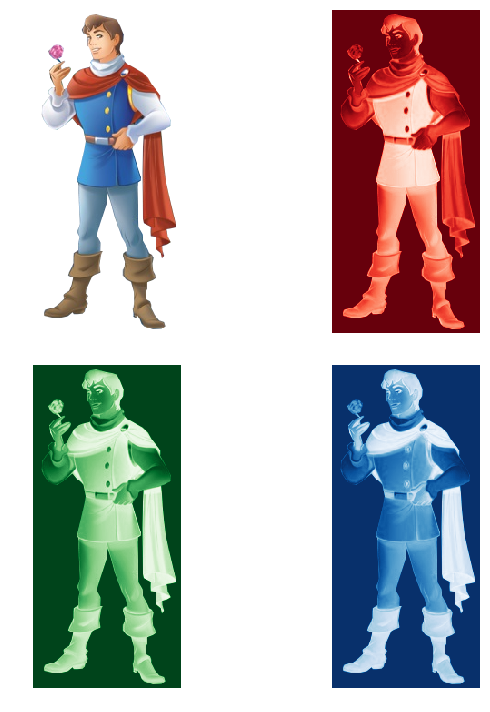

In [4]:
just_RGB(image_good_3)

### <span style="color:purple"> 3.1.2 Define function Grayscale( )

In [5]:
def Grayscale(image):
    image_gray = PIL.ImageOps.invert(image.convert('L'))
    image_grayArr = np.asarray(image_gray)
    image_grayArr.shape
    imageArr = np.asarray(image)
    imageArr.shape
    imgRatio = imageArr.shape[0] / imageArr.shape[1]
    fig, ax = plt.subplots(figsize = (15, 15))
    ax.imshow(image_grayArr) #No third dimension
    ax.axis('off')
    plt.show()
    return

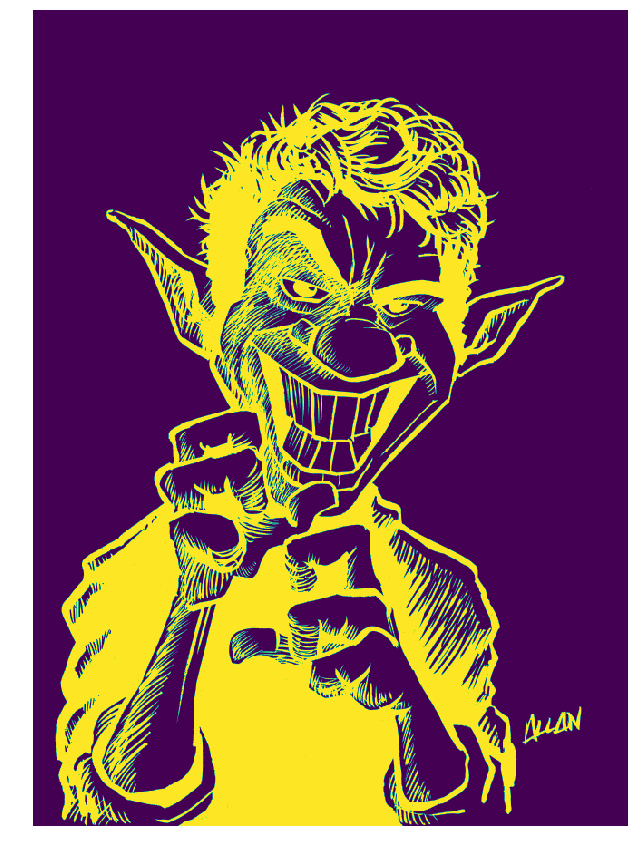

In [6]:
Grayscale(image_evil_4)

## <span style="color:purple"> 3.2 Blob Detection
<span style="color:purple"> Use the following approaches applied to Blob detection: <br>
(1) Laplacian of Gaussian (LoG) <br>
(2) Difference of Gaussian (DoG) <br>
(3) Determinant of Hessian (DoH) <br>
    
<span style="color:purple">**Research Object: ** <br>
The object of this section is to study which approach performs the Blob Detection well. I used the picture of snow white and have the followign findings <br>
(1) The sensitivity ranking follows LoG >> DoG >> DoH. Specifically, LoG captures the most details and have smaller circles. DoG is less "careful" and could only capture some of the most obvious areas with different brightness etc. In contrast, the DoH is the most "inert" approach -- the detection is poor. <br>
(2) Then I also select one "Evil" picture in order to compare the detection result with the "Good" picture. 



### <span style="color:purple"> 3.2.1 LoG

In [7]:
def LoG_plot(image):
    image_gray = PIL.ImageOps.invert(image.convert('L'))
    image_grayArr = np.asarray(image_gray)
    blobs_log = skimage.feature.blob_log(image_grayArr, max_sigma=30, num_sigma=5, threshold=.1)
    blobs_log[:, 2] = blobs_log[:, 2] * np.sqrt(2) #Radi
    fig, ax = plt.subplots(figsize = (15, 15))
    ax.axis('off')

    plt.imshow(image_grayArr, interpolation='nearest')
    for blob in blobs_log:
        y, x, r = blob
        c = plt.Circle((x, y), r, linewidth=2, fill=False)
        ax.add_patch(c)
    return

### <span style="color:purple"> 3.2.2 DoG

In [8]:
def DoG_plot(image):
    image_gray = PIL.ImageOps.invert(image.convert('L'))
    image_grayArr = np.asarray(image_gray)
    blobs_dog = skimage.feature.blob_dog(image_grayArr, max_sigma=30, threshold=.1)
    blobs_dog[:, 2] = blobs_dog[:, 2] * np.sqrt(2)
    fig, ax = plt.subplots(figsize = (15, 15))
    ax.axis('off')

    plt.imshow(image_grayArr, interpolation='nearest')
    for blob in blobs_dog:
        y, x, r = blob
        c = plt.Circle((x, y), r, linewidth=2, fill=False)
        ax.add_patch(c)
    return

### <span style="color:purple"> 3.2.3 DoH

In [9]:
def DoH_plot(image):
    image_gray = PIL.ImageOps.invert(image.convert('L'))
    image_grayArr = np.asarray(image_gray)
    blobs_doh = skimage.feature.blob_doh(image_grayArr, max_sigma=30, threshold=.01)
    fig, ax = plt.subplots(figsize = (15, 15))
    ax.axis('off')

    plt.imshow(image_grayArr, interpolation='nearest')
    for blob in blobs_doh:
        y, x, r = blob
        c = plt.Circle((x, y), r, linewidth=2, fill=False)
        ax.add_patch(c)
    return

### <span style="color:purple"> 3.2.4 Graph

------------- LoG Approach -------------
------------- DoG Approach -------------
------------- DoH Approach -------------


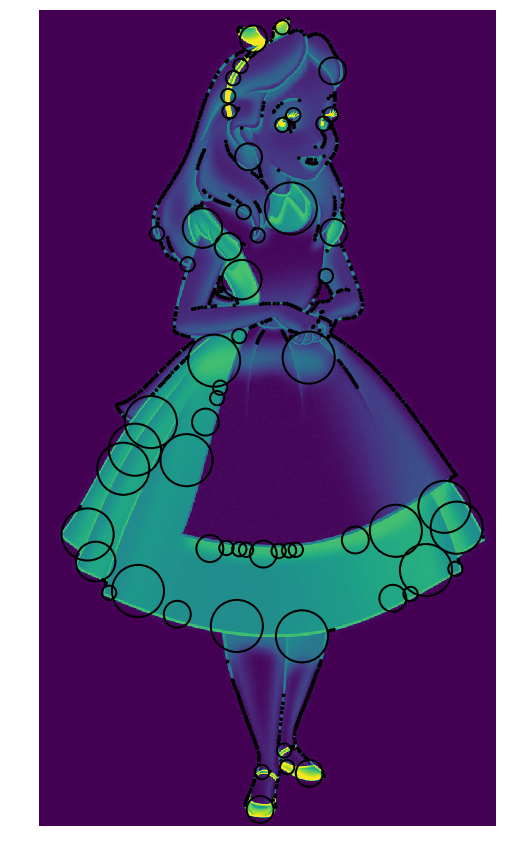

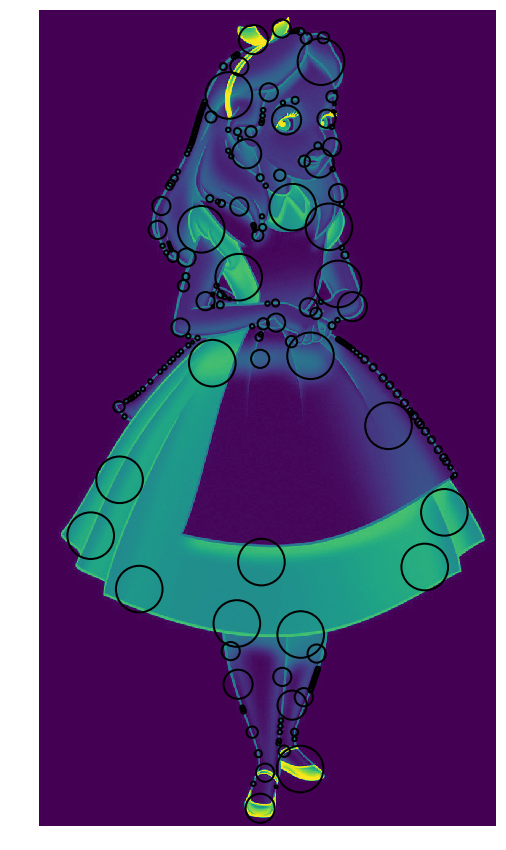

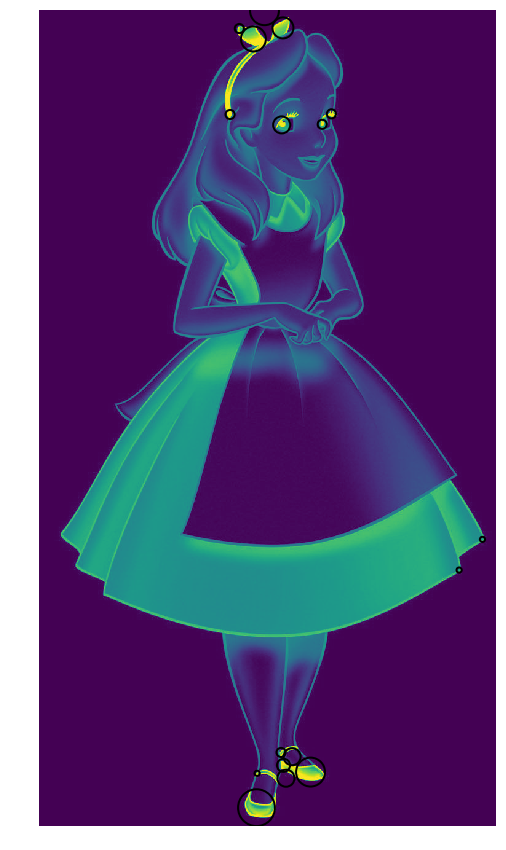

In [10]:
print('------------- LoG Approach -------------')
LoG_plot(image_good_1)

print('------------- DoG Approach -------------')
DoG_plot(image_good_1)

print('------------- DoH Approach -------------')
DoH_plot(image_good_1)

------------- LoG Approach -------------
------------- DoG Approach -------------
------------- DoH Approach -------------


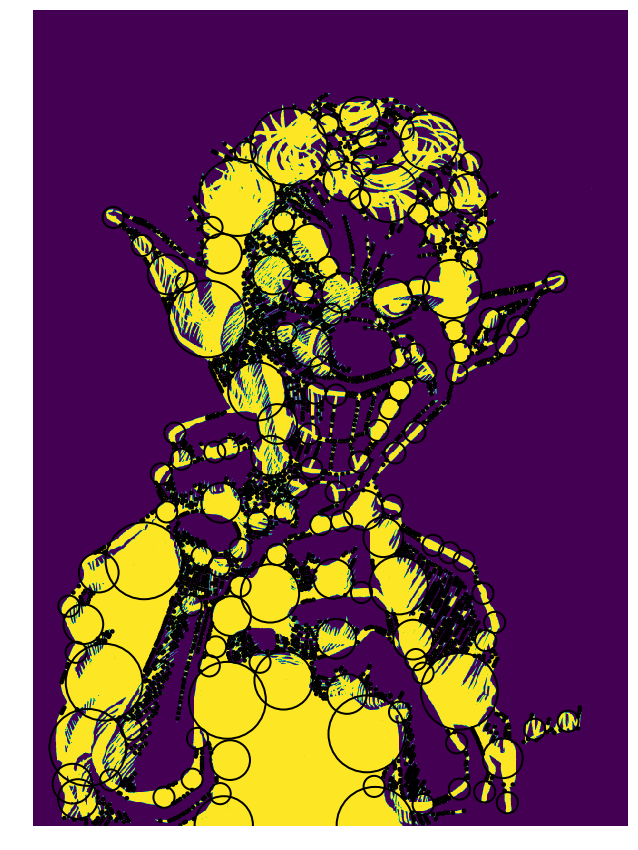

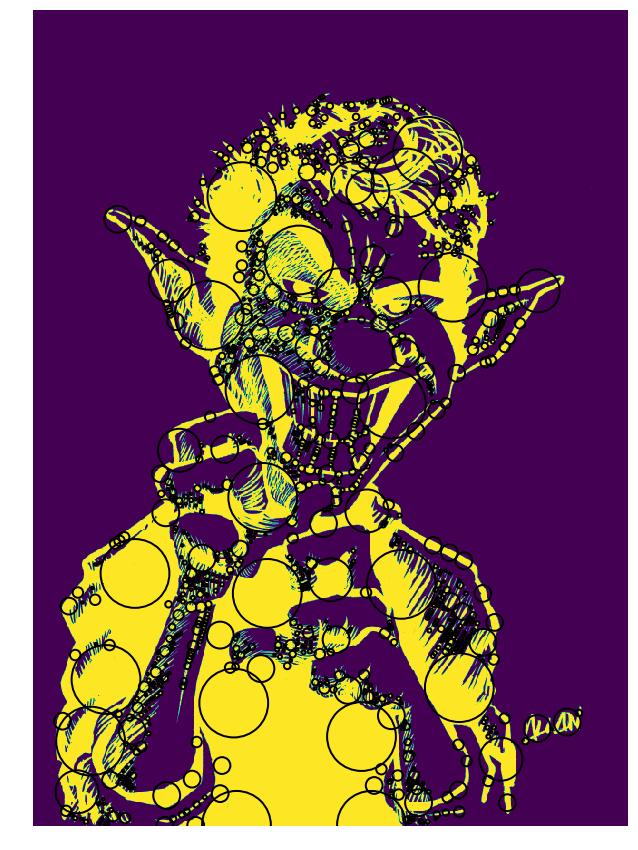

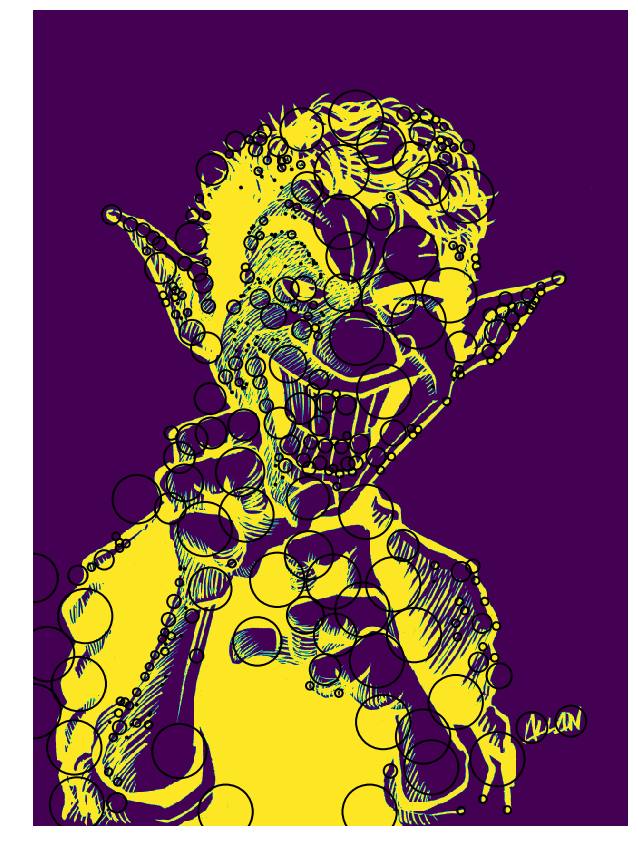

In [11]:
print('------------- LoG Approach -------------')
LoG_plot(image_evil_4)

print('------------- DoG Approach -------------')
DoG_plot(image_evil_4)

print('------------- DoH Approach -------------')
DoH_plot(image_evil_4)

### <span style="color:purple"> 3.2.5 Region Adjacency Graphs (RAGs)

In [12]:
def RAGs(image):
    image_gray = PIL.ImageOps.invert(image.convert('L'))
    image_grayArr = np.asarray(image_gray)
    labels = skimage.segmentation.slic(image_grayArr, compactness=30, n_segments=400)
    g = skimage.future.graph.rag_mean_color(image_grayArr, labels)
    fig, ax = plt.subplots(figsize = (15, 15))
    ax.axis('off')
    lc = skimage.future.graph.show_rag(labels, g, image_grayArr, ax = ax)
    return

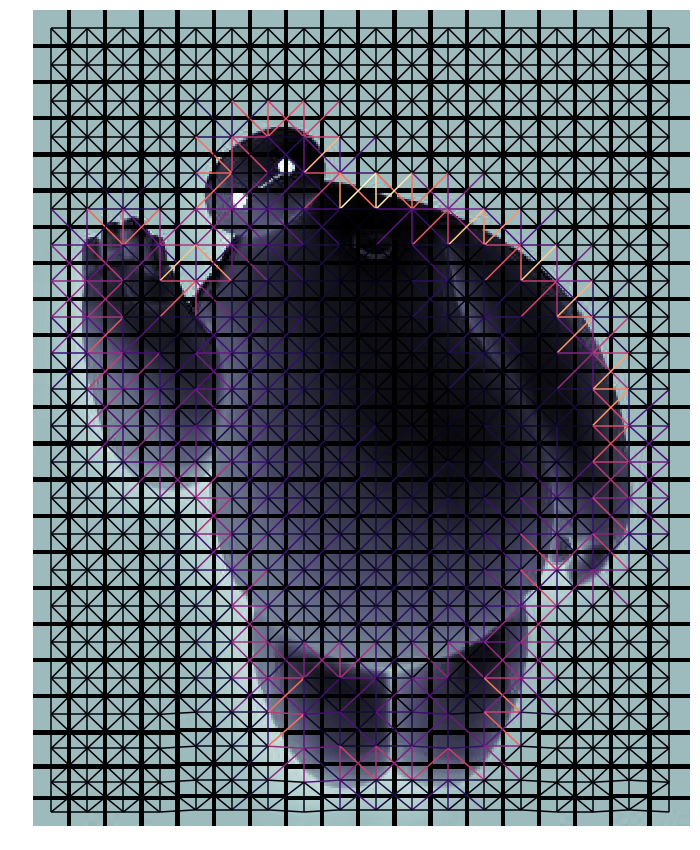

In [13]:
RAGs(image_good_4)

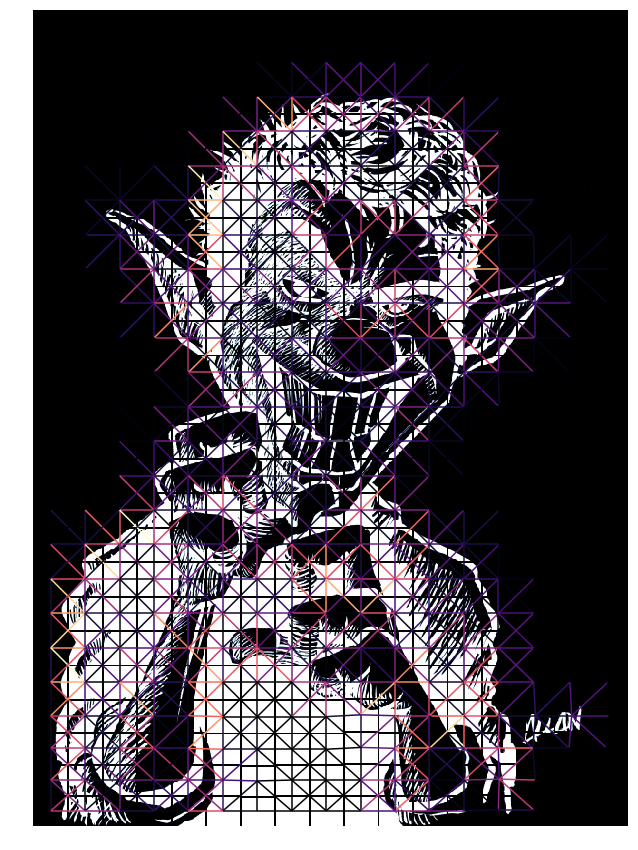

In [14]:
RAGs(image_evil_4)

In [15]:
def normalizeConvo(a_c):
    s = np.sum(a_c.flatten())
    return a_c / s

def displayConvolution(img, convArray, threshold = None):
    img_array = np.asarray(img).astype('uint8')
    
    if len(img_array.shape) > 2:
        conv = np.zeros(img_array.shape)
        for i in range(img_array.shape[2]):
            conv[:,:,i] = scipy.ndimage.convolve(img_array[:,:,i], normalizeConvo(convArray), mode='constant')
    else:
        conv = scipy.ndimage.convolve(img_array, normalizeConvo(convArray), mode='constant')
    conv = conv.astype('uint8')
    if threshold is not None:
        if threshold < 1:
            threshold = threshold * 255
        conv[conv < threshold] = 0
    
    conv_image = PIL.Image.fromarray(conv)
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize = (17, 10))
    #This is to deal with some annoying plt/PIL stuff
    if len(img_array.shape) > 2:
        ax1.imshow(img)
    else:
        ax1.imshow(img_array)
    ax1.axis('off')
    ax1.set_title("Original")
    #return conv_image
    if len(img_array.shape) > 2:
        ax2.imshow(conv_image)
    else:
        ax2.imshow(np.asarray(conv_image))
    ax2.axis('off')
    ax2.set_title("Convolution")
    
    diff = PIL.ImageChops.difference(conv_image, img)
    if len(img_array.shape) > 2:
        ax3.imshow(diff)
    else:
        ax3.imshow(np.asarray(diff))
    ax3.axis('off')
    ax3.set_title("Difference")
    plt.tight_layout()
    plt.show()
    #Not returning anything to make displaying nicer

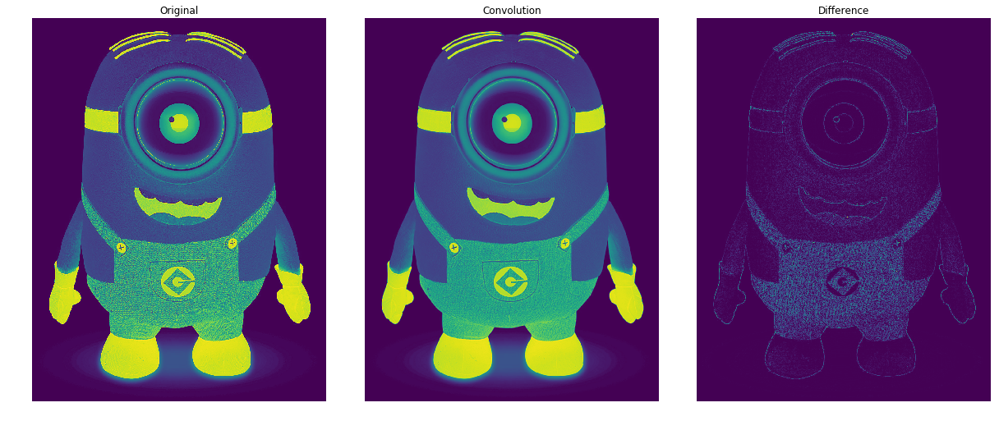

In [16]:
image_gray = PIL.ImageOps.invert(image_good_5.convert('L'))
image_grayArr = np.asarray(image_gray)
smoothingKernel = np.array([
    [1, 1, 1],
    [1, 2, 1],
    [1, 1, 1]])
c = displayConvolution(image_gray, smoothingKernel)

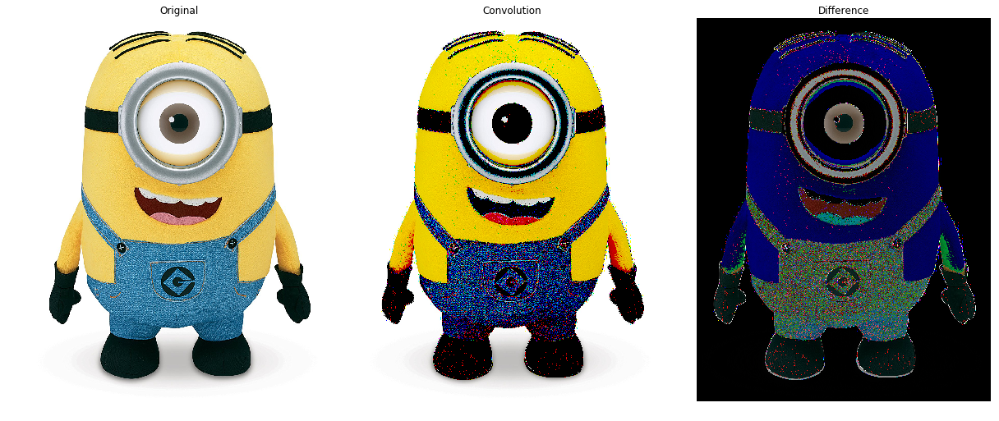

In [17]:
verticalLineKernel = np.array([
    [1, 0, -1],
    [0, 8, 0],
    [1, 0, -1]])
displayConvolution(image_good_5, verticalLineKernel, threshold=.6)

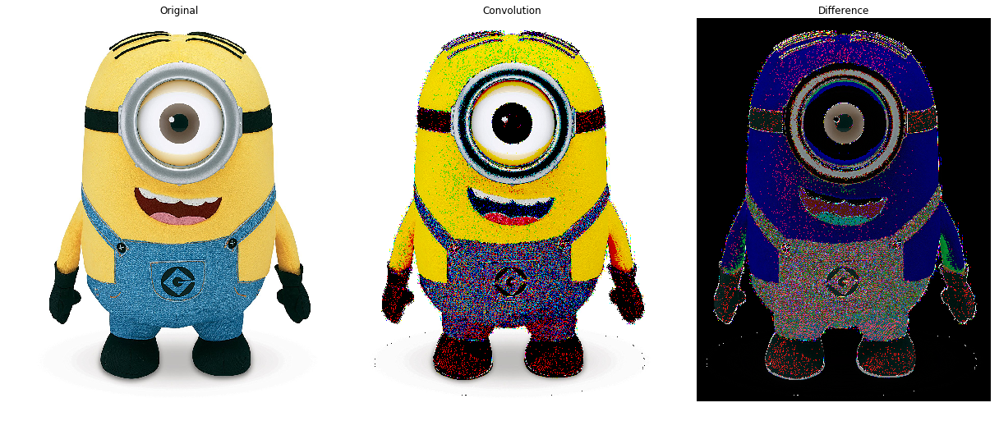

In [18]:
diagonalLineKernel = np.array([
    [-1, 0, -1],
    [0, 8, 0],
    [1, 0, -1]])
displayConvolution(image_good_5, diagonalLineKernel, threshold=.6)

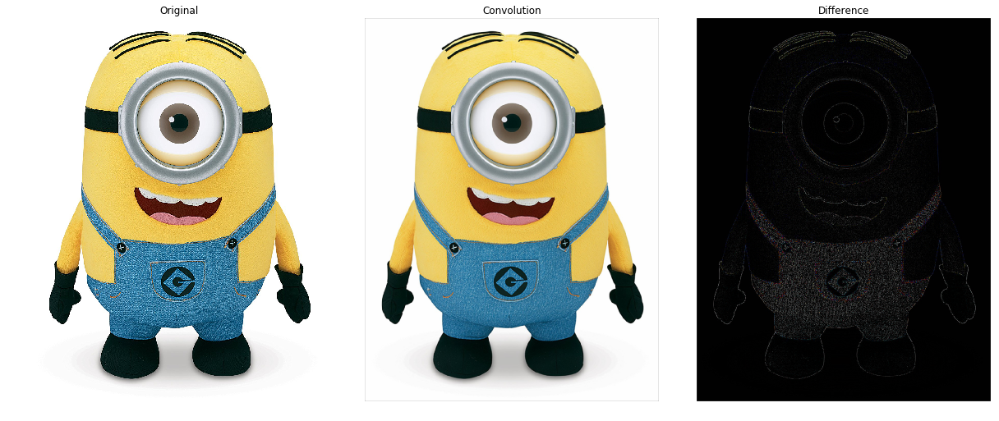

In [19]:
blurKernel = np.array([
    [1, 2, 4, 2, 1],
    [2, 4, 8, 4, 2],
    [4, 8, 16, 8, 4],
    [2, 4, 8, 4, 2],
    [1, 2, 4, 2, 1]])
displayConvolution(image_good_5, blurKernel)

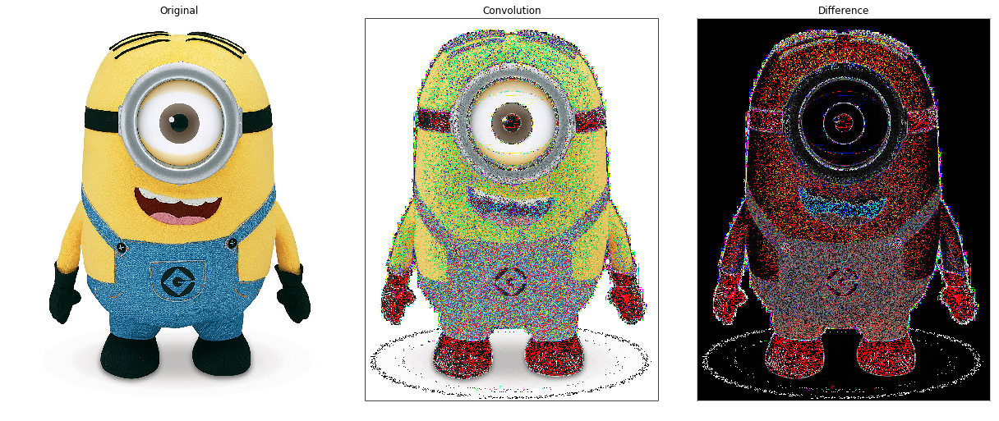

In [20]:
SharpenKernel = np.array([
    [ 0,  0,  -1,  0,  0],
    [ 0, -1,  -2, -1,  0],
    [-1, -2,  20, -2, -1],
    [ 0, -1,  -2, -1,  0],
    [ 0,  0,  -1,  0,  0]])
displayConvolution(image_good_5, SharpenKernel)

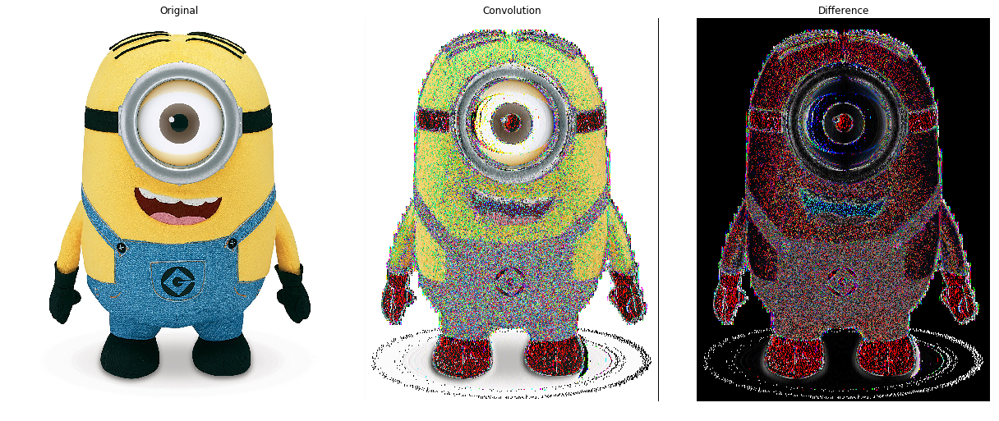

In [21]:
differentKernel = np.array([
    [ 1, 0,  0, 0,  -1],
    [ 1, 0,  0, 0,  -1],
    [ 1, 0,  1, 0,  -1],
    [ 1, 0,  0, 0,  -1],
    [ 1, 0,  0, 0,  -1]])
#This looks neat
displayConvolution(image_good_5, differentKernel)

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">Construct cells immediately below this that report the results from experiments in which you place each of images taken or retrieved for the last exercise through the online demos for [caffe](http://demo.caffe.berkeleyvision.org) and [places](http://places.csail.mit.edu/demo.html). Paste the image and the output for both object detector and scene classifier below, beside one another. Calculate precision and recall for caffe's ability to detect objects of interest across your images. What do you think about Places' scene categories and their assignments to your images? What would be improved labels for your images? Could you use image classification to enhance your research project and, if so, how?

## <span style="color:purple">4.1 Caffe

#### <span style="color:purple">This is Caffe Good 1
![title](Good_shot_1.png)

#### <span style="color:purple">This is Caffe Good 2
![title](Good_shot_2.png)

#### <span style="color:purple">This is Caffe Good 3
![title](Good_shot_3.png)

#### <span style="color:purple">This is Caffe Good 4
![title](Good_shot_4.png)

#### <span style="color:purple">This is Caffe Good 5
![title](Good_shot_5.png)

#### <span style="color:purple">This is Places Good 1
![title](Good_places_1.png)

#### <span style="color:purple">This is Places Good 2
![title](Good_places_2.png)

#### <span style="color:purple">This is Places Good 3
![title](Good_places_3.png)

#### <span style="color:purple"> This is Places Good 4
![title](Good_places_4.png)

#### <span style="color:purple"> This is Places Good 5
![title](Good_places_5.png)

<span style="color:purple"><span style="color:purple">*----------------END----------------* <br>
<span style="color:purple">March 7th, 2018 at Regenstein Library <br>
<span style="color:purple">Jingying Bi <br>